__Реализовать синтезирование лиц из LFW с помощью DCGAN__

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np

import tensorflow as tf
import tensorflow_datasets as tfds

In [2]:
train_ds, info_ds = tfds.load(
    'lfw', 
    as_supervised=True,
    shuffle_files=True,
    with_info=True,
    split='train'
    )

info_ds

Shuffling and writing examples to /root/tensorflow_datasets/lfw/0.1.0.incompleteDRT3UV/lfw-train.tfrecord



Dataset lfw downloaded and prepared to /root/tensorflow_datasets/lfw/0.1.0. Subsequent calls will reuse this data.


tfds.core.DatasetInfo(
    name='lfw',
    version=0.1.0,
    description='Labeled Faces in the Wild:
        A Database for Studying Face Recognition in
        Unconstrained Environments',
    homepage='http://vis-www.cs.umass.edu/lfw',
    features=FeaturesDict({
        'image': Image(shape=(250, 250, 3), dtype=tf.uint8),
        'label': Text(shape=(), dtype=tf.string),
    }),
    total_num_examples=13233,
    splits={
        'train': 13233,
    },
    supervised_keys=('label', 'image'),
    citation="""@TechReport{LFWTech,
        author = {Gary B. Huang and Manu Ramesh and Tamara Berg and Erik Learned-Miller},
        title = {Labeled Faces in the Wild: A Database for Studying Face Recognition in Unconstrained Environments},
        institution = {University of Massachusetts, Amherst},
        year = 2007,
        number = {07-49},
        month = {October}
    }""",
    redistribution_info=,
)

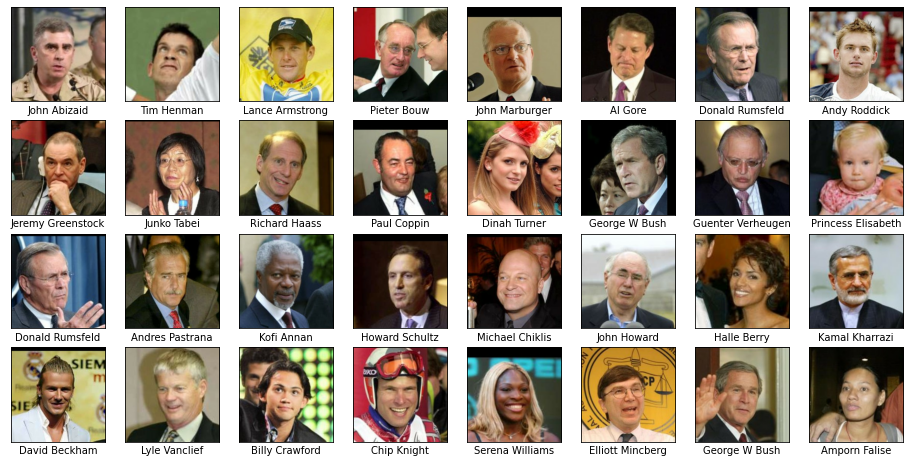

In [3]:
some_samples = [{"image": x[1], "name": x[0]} for x in iter(train_ds.take(32))]

fig = plt.figure(figsize=(16, 8))
for j in range(len(some_samples)):
    ax = fig.add_subplot(4, 8, j+1)
    ax.imshow(some_samples[j]["image"])
    ax.set_xlabel(some_samples[j]["name"].numpy().decode('utf-8').replace("_", " "))
    plt.xticks([]), plt.yticks([])
plt.show()

In [4]:
def prepare(label, img):
    img = (tf.cast(tf.image.resize(img, [256, 256]), tf.float32) - 127.5) / 127.5
    return img

train_ds = train_ds.map(prepare)

In [5]:
generator = tf.keras.Sequential([
    tf.keras.layers.Dense(512*8*8, activation='relu'),
    tf.keras.layers.Reshape((8, 8, 512)),
    tf.keras.layers.UpSampling2D((2, 2)),    
    tf.keras.layers.Conv2D(256, (3, 3), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.ReLU(),    
    tf.keras.layers.UpSampling2D((2, 2)),    
    tf.keras.layers.Conv2D(128, (3, 3), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.ReLU(),
    tf.keras.layers.UpSampling2D((2, 2)),
    tf.keras.layers.Conv2D(64, (3, 3), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.ReLU(),
    tf.keras.layers.UpSampling2D((2, 2)),
    tf.keras.layers.Conv2D(32, (3, 3), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.ReLU(),
    tf.keras.layers.UpSampling2D((2, 2)),
    tf.keras.layers.Conv2D(16, (3, 3), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.ReLU(),      
    tf.keras.layers.Conv2D(3, (3, 3), padding='same', activation='tanh'),
])

discriminator = tf.keras.Sequential([
    tf.keras.layers.experimental.preprocessing.Resizing(256, 256),
    tf.keras.layers.Conv2D(32, (3, 3), strides=(2, 2), padding='same'),
    tf.keras.layers.LeakyReLU(0.2),
    tf.keras.layers.Dropout(0.25),    
    tf.keras.layers.Conv2D(64, kernel_size=3, strides=(2, 2), padding='same'),
    tf.keras.layers.ZeroPadding2D(padding=((0, 1), (0, 1))),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Conv2D(128, kernel_size=3, strides=(2, 2), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Conv2D(256, kernel_size=3, strides=(2, 2), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Conv2D(512, kernel_size=3, strides=(2, 2), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1),
])

In [6]:
INPUT_DIM = 100
NUM_EPOCHS = 50
HALF_BATCH_SIZE = 16
BATCH_SIZE = HALF_BATCH_SIZE * 2
LEARNING_RATE = 0.0002

train_ds = train_ds.repeat(NUM_EPOCHS)
train_ds = train_ds.batch(HALF_BATCH_SIZE, drop_remainder=True)

optimizer = tf.keras.optimizers.Adam(LEARNING_RATE)
sigmoid_cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [7]:
def plot_images(samples):
    fig = plt.figure(figsize=(20, 20))
    num = samples.shape[0]
    for j in range(num):
        ax = fig.add_subplot(8, 8, j+1)
        ax.imshow((samples[j, ...].reshape(256, 256, 3) + 1) / 2.)
        plt.xticks([]), plt.yticks([])
    plt.show()

[Step  0] D Loss: 0.7303; G Loss: 0.6976


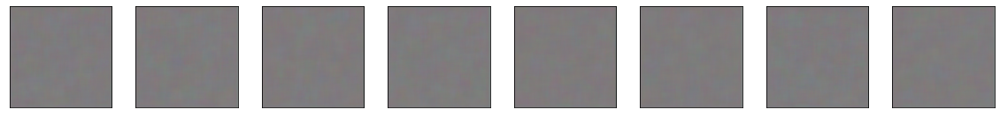

[Step 1000] D Loss: 0.3717; G Loss: 7.7239


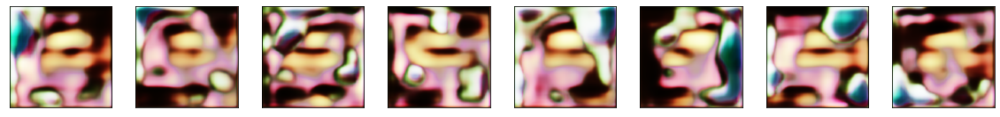

[Step 2000] D Loss: 0.7934; G Loss: 8.7168


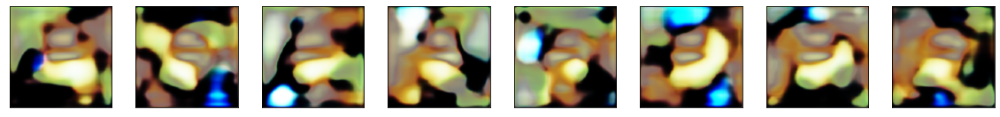

[Step 3000] D Loss: 0.0151; G Loss: 7.4295


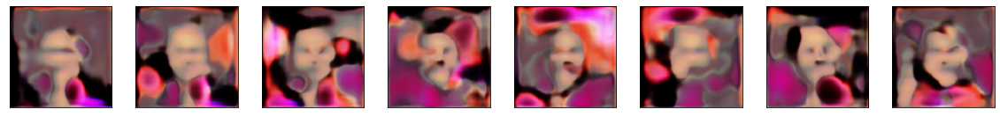

[Step 4000] D Loss: 0.1070; G Loss: 5.4429


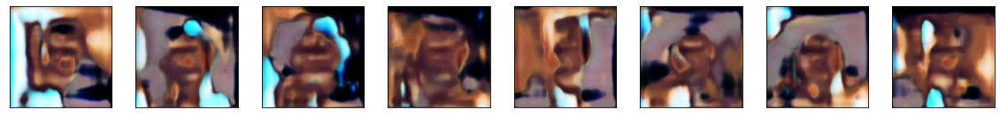

[Step 5000] D Loss: 0.5527; G Loss: 6.1430


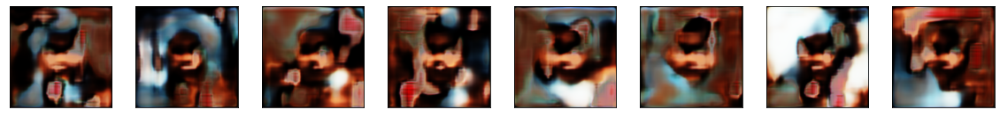

[Step 6000] D Loss: 0.2026; G Loss: 1.7405


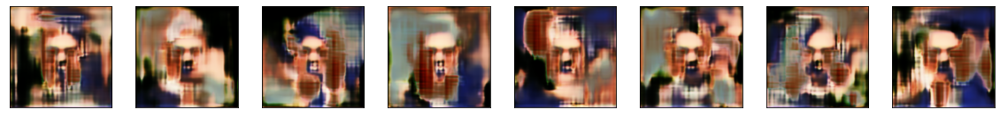

[Step 7000] D Loss: 0.5053; G Loss: 3.3194


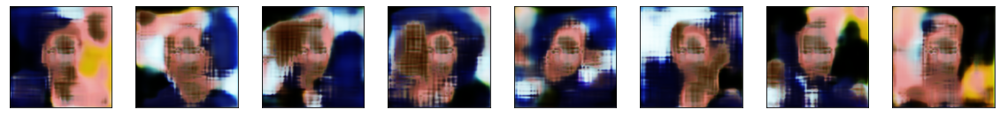

[Step 8000] D Loss: 0.0656; G Loss: 3.3644


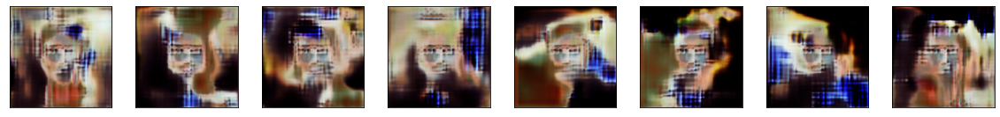

[Step 9000] D Loss: 0.3836; G Loss: 4.0388


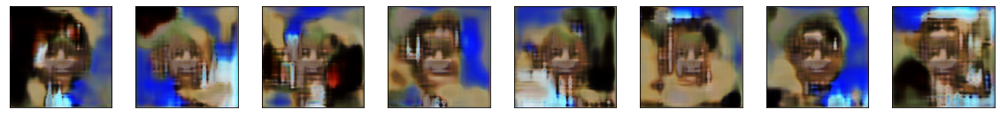

[Step 10000] D Loss: 0.0005; G Loss: 9.3644


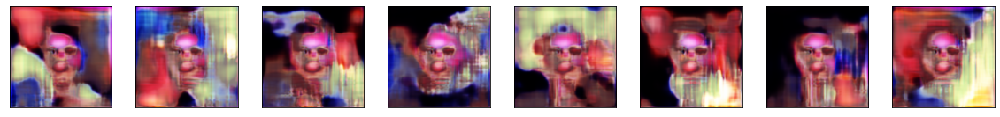

[Step 11000] D Loss: 0.1787; G Loss: 5.8487


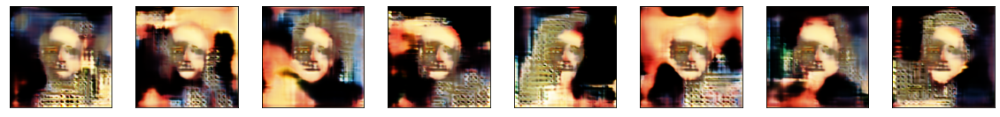

[Step 12000] D Loss: 0.1850; G Loss: 5.1314


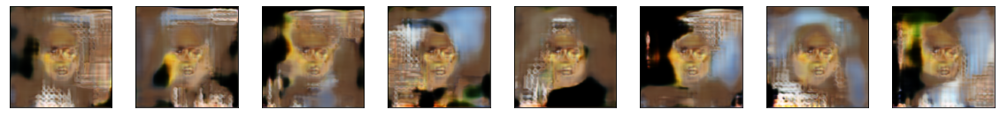

[Step 13000] D Loss: 0.0069; G Loss: 8.1974


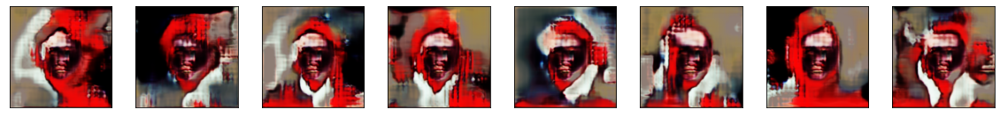

[Step 14000] D Loss: 0.0460; G Loss: 8.0577


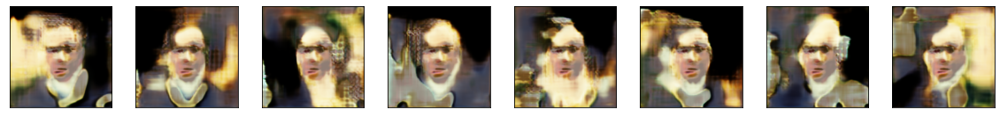

[Step 15000] D Loss: 0.1147; G Loss: 3.8723


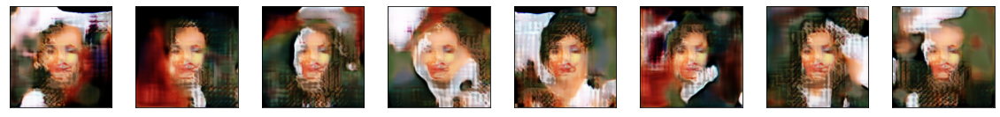

[Step 16000] D Loss: 0.1521; G Loss: 2.3753


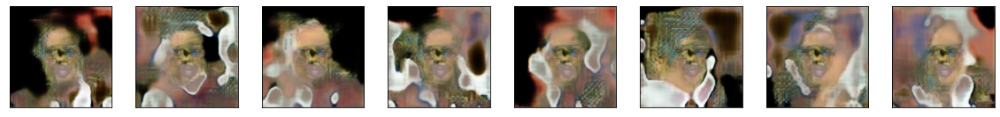

[Step 17000] D Loss: 0.2057; G Loss: 5.5267


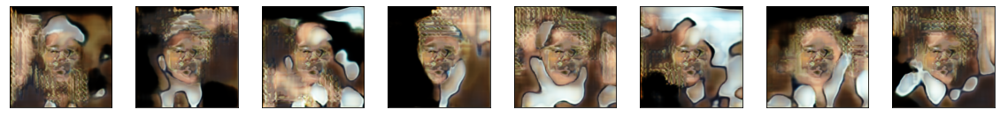

[Step 18000] D Loss: 0.2227; G Loss: 2.0604


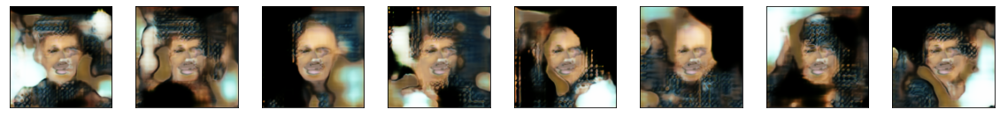

[Step 19000] D Loss: 0.3606; G Loss: 2.7429


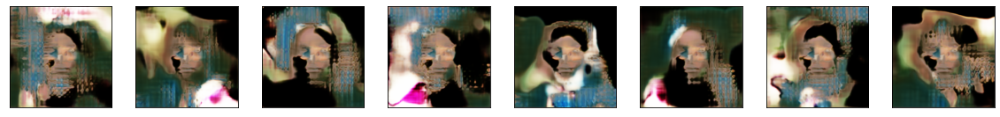

[Step 20000] D Loss: 0.2996; G Loss: 7.0309


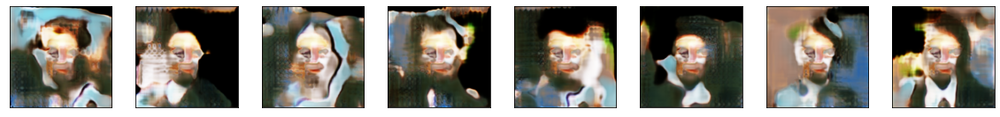

[Step 21000] D Loss: 0.1115; G Loss: 4.7015


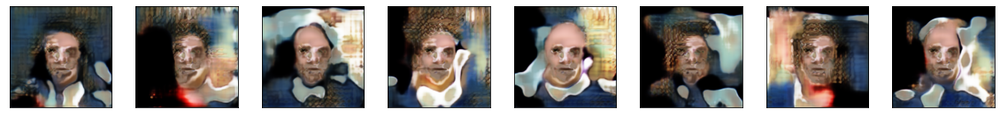

[Step 22000] D Loss: 0.3498; G Loss: 6.4513


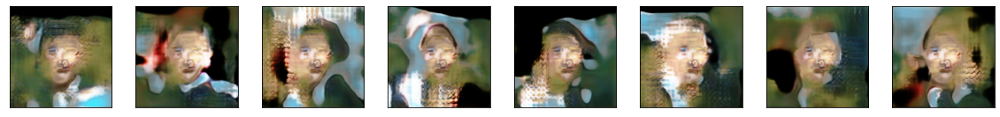

[Step 23000] D Loss: 0.1932; G Loss: 2.5621


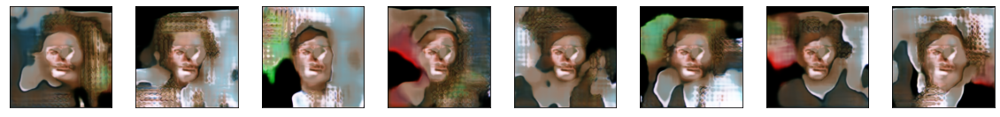

[Step 24000] D Loss: 0.3174; G Loss: 2.3006


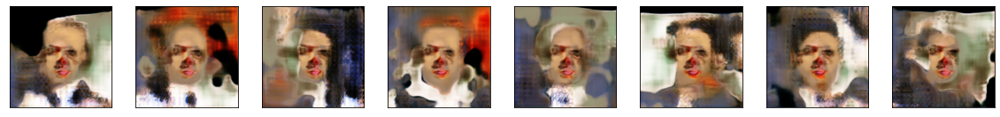

[Step 25000] D Loss: 0.0157; G Loss: 4.2982


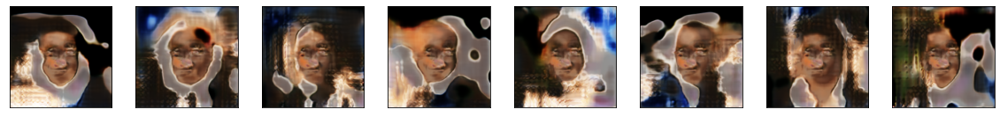

[Step 26000] D Loss: 0.4917; G Loss: 3.4458


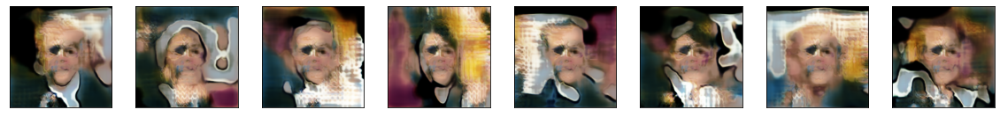

[Step 27000] D Loss: 0.3900; G Loss: 3.6717


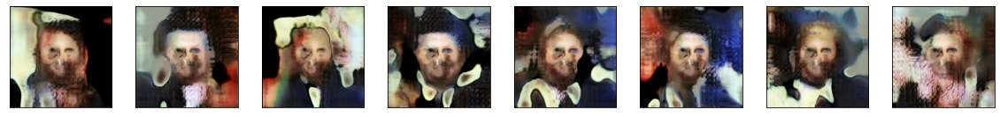

[Step 28000] D Loss: 0.3583; G Loss: 3.1819


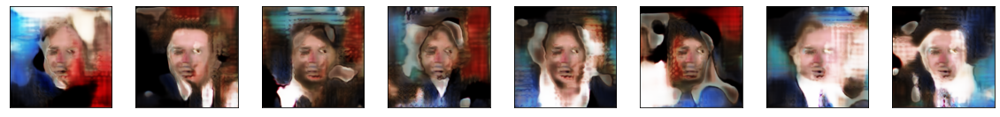

[Step 29000] D Loss: 0.1555; G Loss: 6.9407


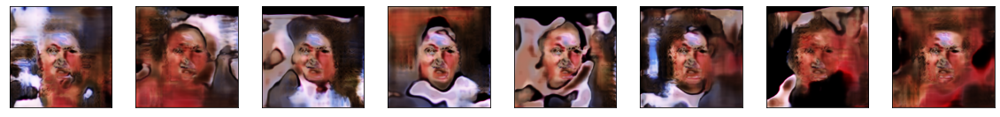

[Step 30000] D Loss: 0.1983; G Loss: 3.7461


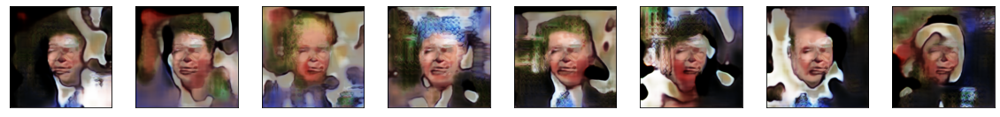

[Step 31000] D Loss: 0.0993; G Loss: 3.7540


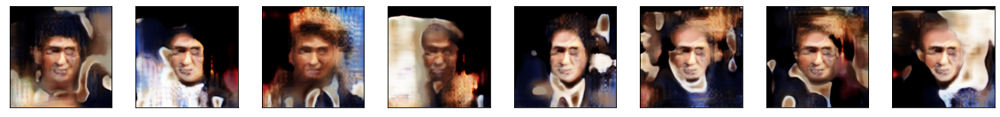

[Step 32000] D Loss: 0.2434; G Loss: 2.1720


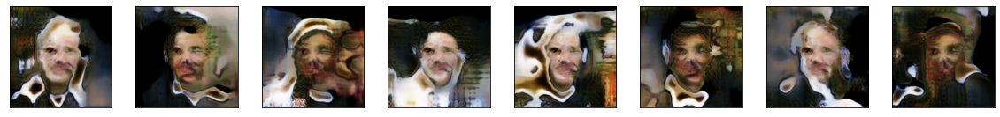

[Step 33000] D Loss: 0.0803; G Loss: 2.9902


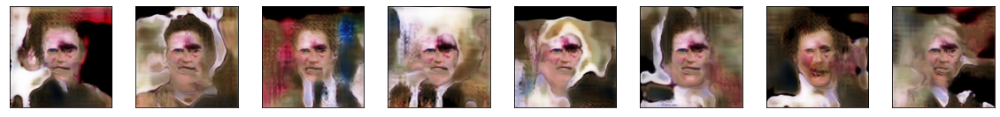

[Step 34000] D Loss: 0.1304; G Loss: 2.2529


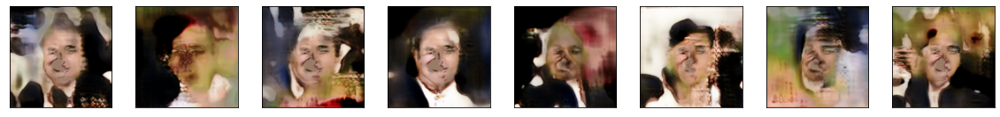

[Step 35000] D Loss: 0.1827; G Loss: 3.2815


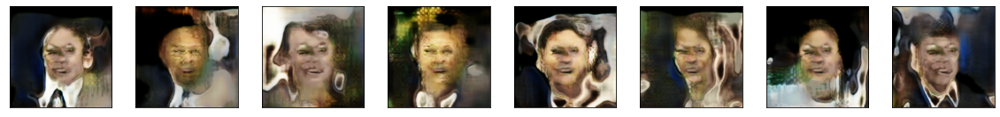

[Step 36000] D Loss: 0.1823; G Loss: 1.3949


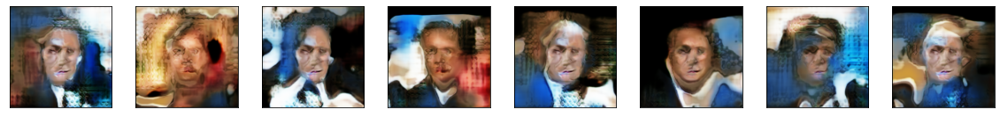

[Step 37000] D Loss: 0.2567; G Loss: 3.5894


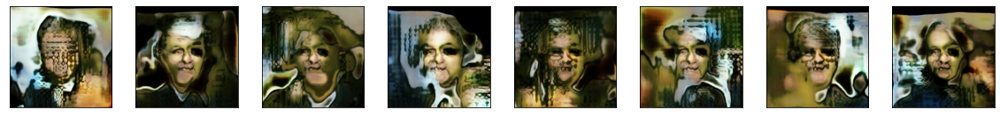

[Step 38000] D Loss: 0.3384; G Loss: 3.9876


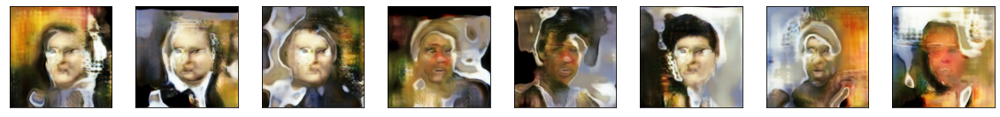

[Step 39000] D Loss: 0.2656; G Loss: 2.3283


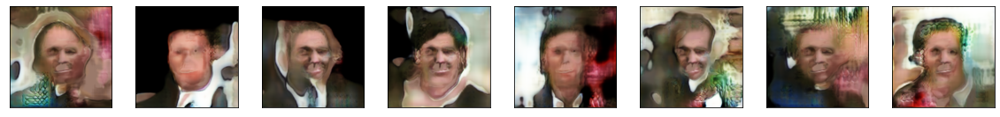

[Step 40000] D Loss: 0.1285; G Loss: 3.3405


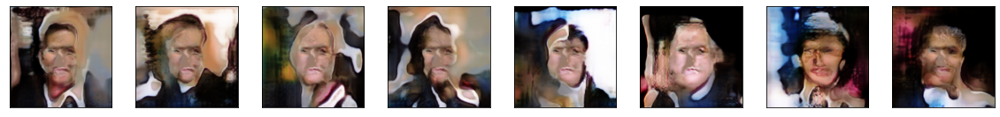

[Step 41000] D Loss: 0.0920; G Loss: 2.7415


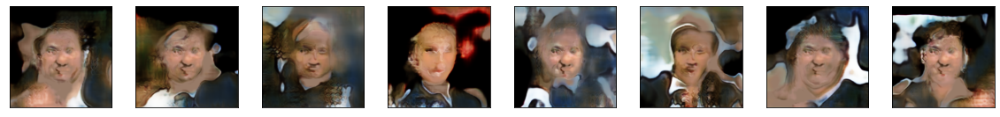

In [8]:
for step, true_images in enumerate(train_ds):
    
    # Train Discriminator
    noise = np.random.normal(0, 1, (HALF_BATCH_SIZE, INPUT_DIM)).astype(np.float32)
    syntetic_images = generator.predict(noise)
    x_combined = np.concatenate((
        true_images, 
        syntetic_images))
    y_combined = np.concatenate((
        np.ones((HALF_BATCH_SIZE, 1), np.float32), 
        np.zeros((HALF_BATCH_SIZE, 1), np.float32)))
    
    with tf.GradientTape() as tape:
        logits = discriminator(x_combined, training=True)
        d_loss_value = sigmoid_cross_entropy(y_combined, logits)
    grads = tape.gradient(d_loss_value, discriminator.trainable_variables)
    optimizer.apply_gradients(zip(grads, discriminator.trainable_variables))
    
    # Train Generator
    
    noise = np.random.normal(0, 1, (BATCH_SIZE, INPUT_DIM)).astype(np.float32)
    y_mislabled = np.ones((BATCH_SIZE, 1), np.float32)
    
    with tf.GradientTape() as tape:
        syntetic = generator(noise, training=True)
        logits = discriminator(syntetic, training=False)
        g_loss_value = sigmoid_cross_entropy(y_mislabled, logits)
    grads = tape.gradient(g_loss_value, generator.trainable_variables)
    optimizer.apply_gradients(zip(grads, generator.trainable_variables))
    
    # Check intermediate results
    
    if step % 1000 == 0:
        print('[Step %2d] D Loss: %.4f; G Loss: %.4f' % (
            step, d_loss_value.numpy(), g_loss_value.numpy()))
        noise = np.random.normal(0, 1, (8, INPUT_DIM)).astype(np.float32)
        syntetic_images = generator.predict(noise)
        plot_images(syntetic_images)

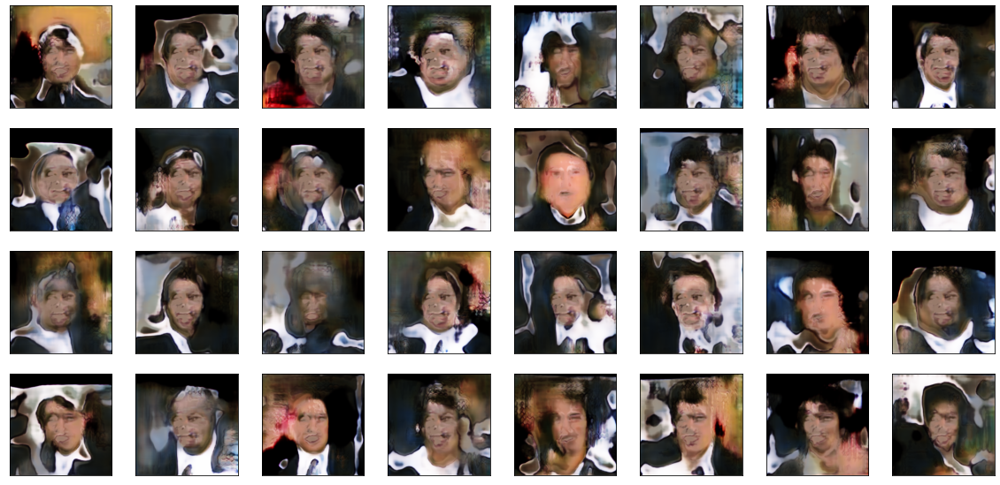

In [9]:
# Тестирование свёрточного генератора
noise = np.random.normal(0, 1, (32, INPUT_DIM)).astype(np.float32)
syntetic_images = generator.predict(noise)
plot_images(syntetic_images)

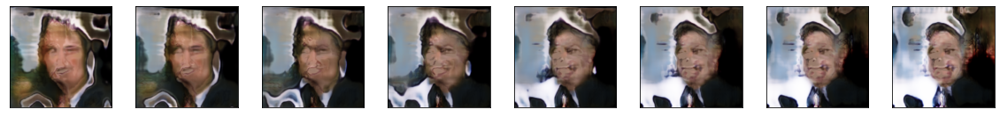

In [10]:
# Интерполяция в латентном пространстве
noise_1 = np.random.normal(0, 1, (INPUT_DIM)).astype(np.float32)
noise_2 = np.random.normal(0, 1, (INPUT_DIM)).astype(np.float32)
noise = np.linspace(noise_1, noise_2, 8)
syntetic_images = generator.predict(noise)
plot_images(syntetic_images)